In [19]:
# Let's add the root directory to our system search path to allow imports from sibling directories.
import os, sys
module_path = os.path.abspath(os.path.join(".."))
if module_path not in sys.path:
    sys.path.append(module_path)

In [ ]:
import random
import matplotlib.pyplot as plt
from torchvision.transforms import v2

from src.dataset import SonarDataset, SonarDataTransform, GaussianNoise, NormalizeTransform, TVGAttenuation

DATASET = SonarDataset(data_dir="../data/processed")
NORMALIZE = NormalizeTransform()

N = len(DATASET)
N_TILES = 5
TILES = [DATASET[i * N // N_TILES][0] for i in range(N_TILES)]  # Get 5 different tiles from the dataset

print(f"Dataset size: {N}")

Dataset size: 367976


In [21]:
def get_random_indices():
    if N < N_TILES:
        return list(range(N))
    return random.sample(range(N), N_TILES)

def show_images(images, normalize=True):
    _, axes = plt.subplots(1, 5, figsize=(15, 3))
    for i, image in enumerate(images):
        img = NORMALIZE(image[0]).squeeze() if normalize else image[0].squeeze()
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(image[1])
        axes[i].axis('off')
    plt.show()

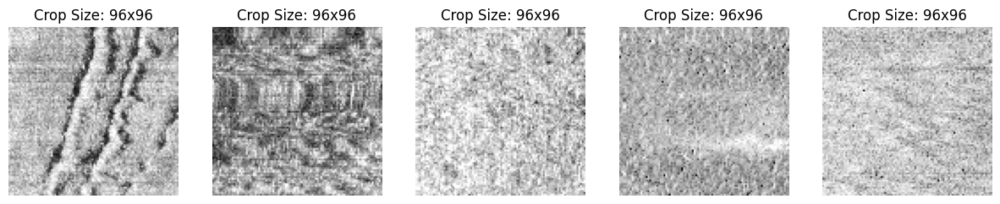

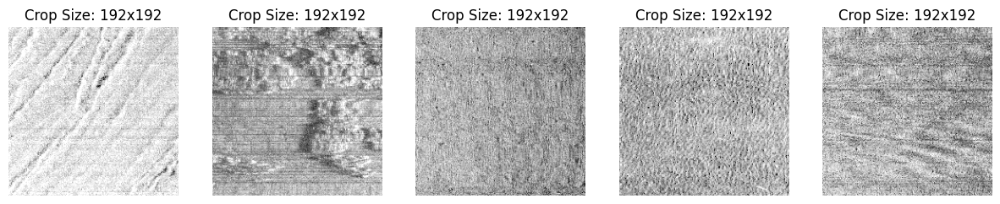

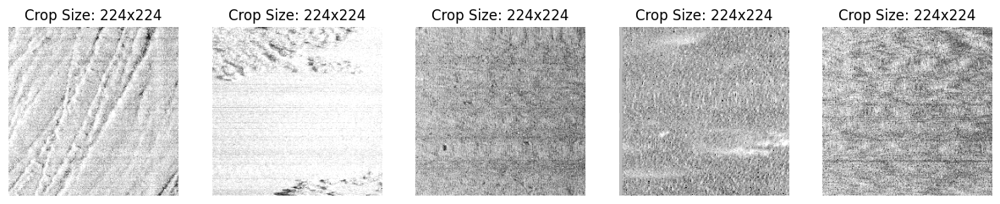

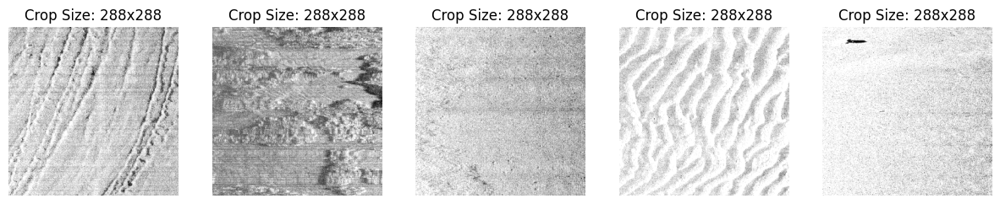

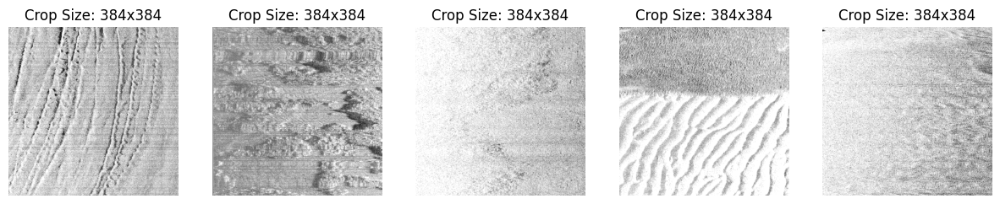

In [22]:
for crop_size in (96, 192, 224, 288, 384):
    crop = v2.RandomCrop((crop_size, crop_size))

    show_images([
        (crop(tile), f"Crop Size: {crop_size}x{crop_size}")
        for tile in TILES
    ])

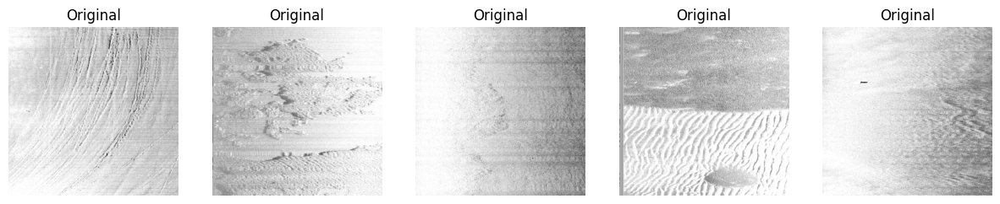

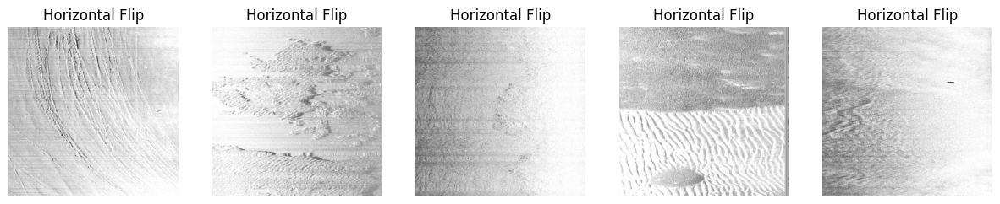

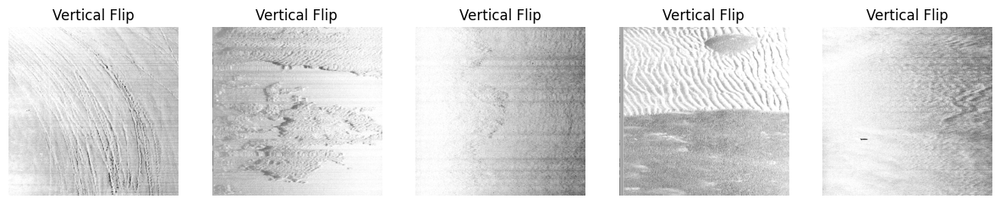

In [23]:
for aug in [
    (lambda x: x, "Original"),
    (v2.RandomHorizontalFlip(p=1.0), "Horizontal Flip"),
    (v2.RandomVerticalFlip(p=1.0), "Vertical Flip"),
]:
    show_images([
        (aug[0](tile), aug[1])
        for tile in TILES
    ])

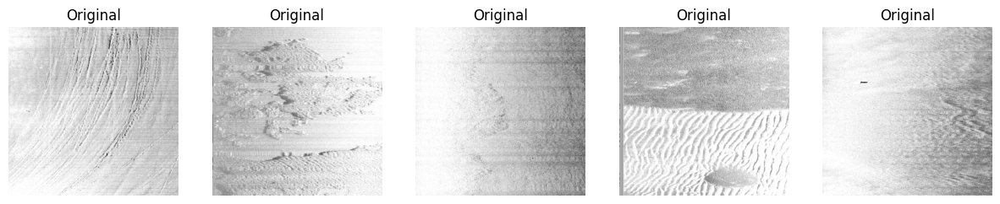

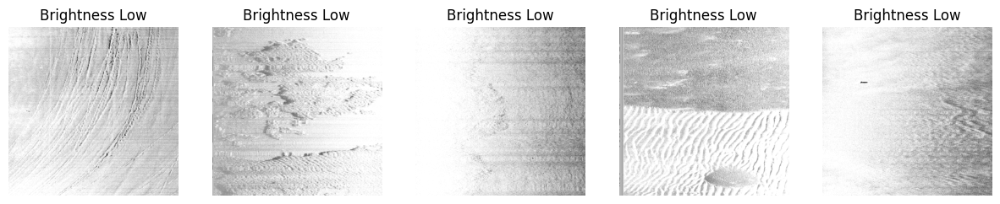

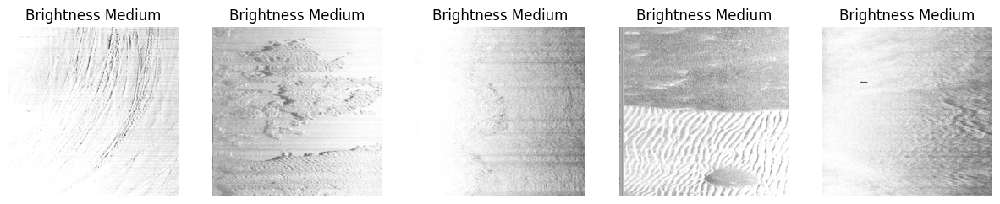

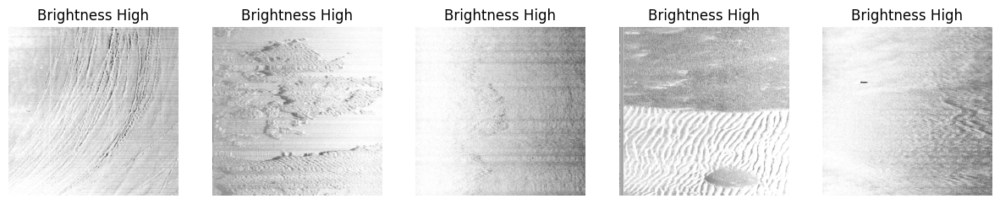

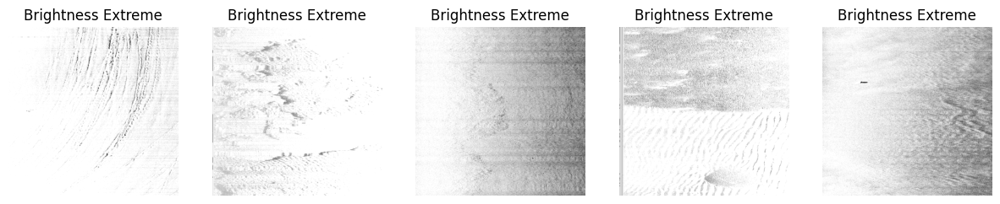

In [24]:
for aug in [
    (lambda x: x, "Original"),
    (v2.ColorJitter(
        brightness=0.10,
        contrast=0,
        saturation=0, hue=0
    ), "Brightness Low"),
    (v2.ColorJitter(
        brightness=0.25,
        contrast=0,
        saturation=0, hue=0
    ), "Brightness Medium"),
    (v2.ColorJitter(
        brightness=0.50,
        contrast=0,
        saturation=0, hue=0
    ), "Brightness High"),
    (v2.ColorJitter(
        brightness=0.75,
        contrast=0,
        saturation=0, hue=0
    ), "Brightness Extreme"),
]:
    show_images([
        (aug[0](tile), aug[1])
        for tile in TILES
    ])

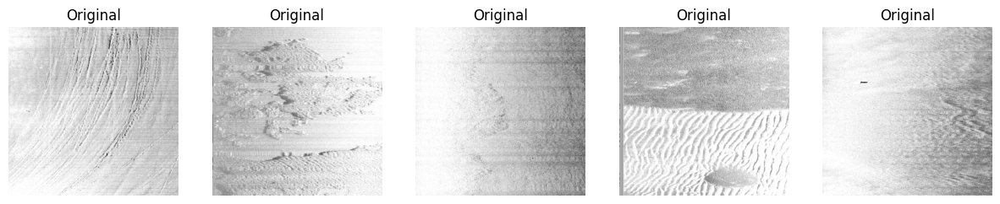

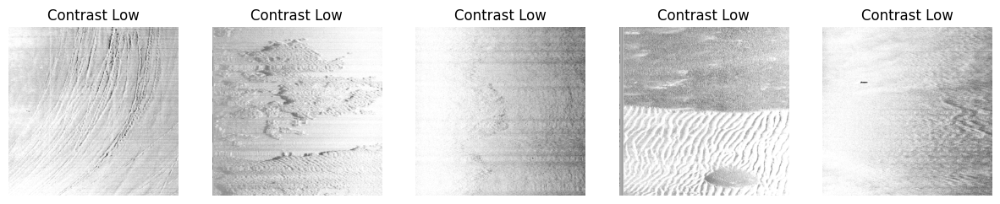

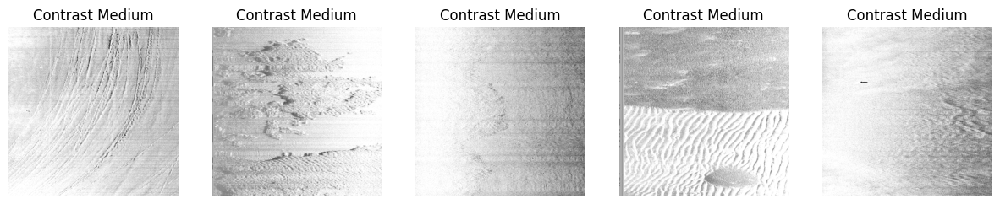

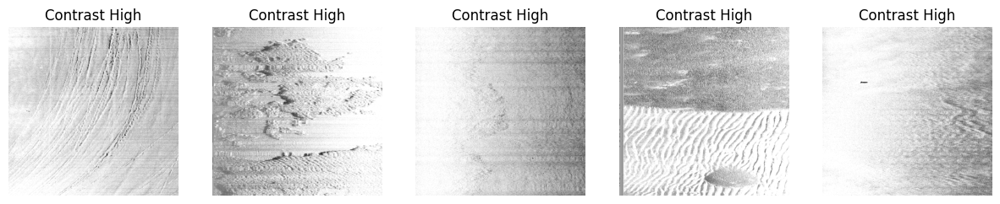

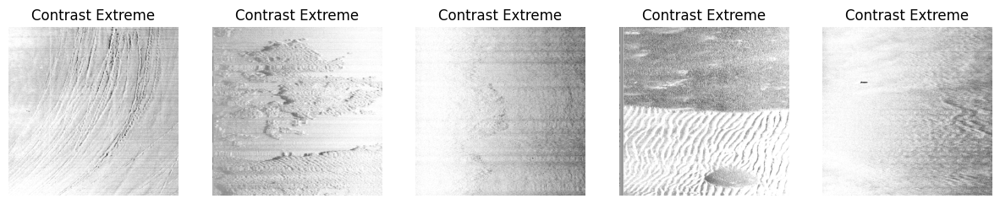

In [25]:
for aug in [
    (lambda x: x, "Original"),
    (v2.ColorJitter(
        brightness=0,
        contrast=0.10,
        saturation=0, hue=0
    ), "Contrast Low"),
    (v2.ColorJitter(
        brightness=0,
        contrast=0.25,
        saturation=0, hue=0
    ), "Contrast Medium"),
    (v2.ColorJitter(
        brightness=0,
        contrast=0.50,
        saturation=0, hue=0
    ), "Contrast High"),
    (v2.ColorJitter(
        brightness=0,
        contrast=0.75,
        saturation=0, hue=0
    ), "Contrast Extreme"),
]:
    show_images([
        (aug[0](tile), aug[1])
        for tile in TILES
    ])

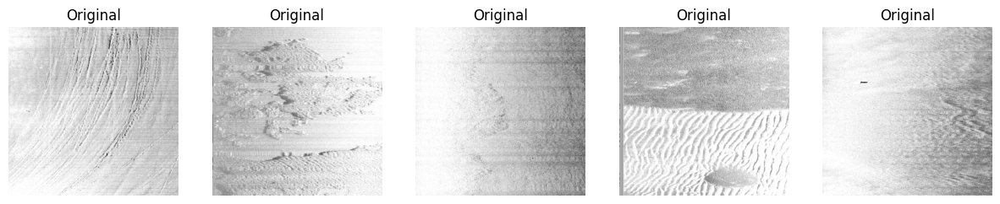

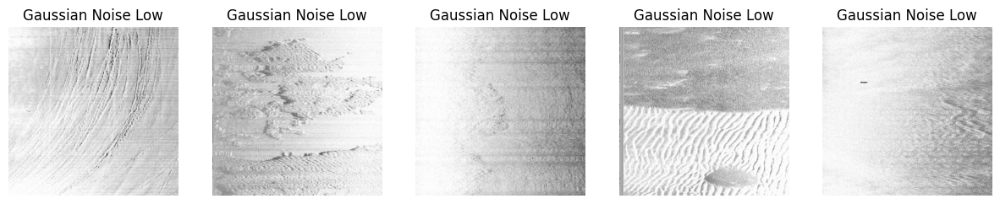

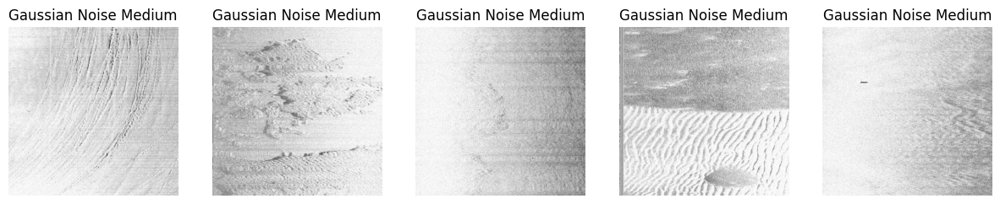

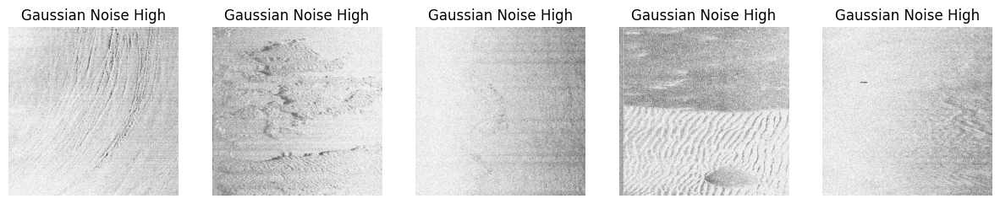

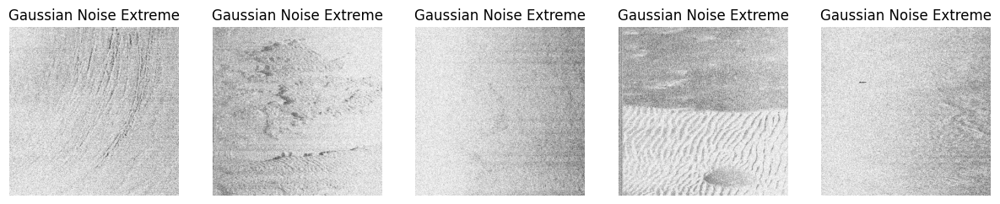

In [26]:
for aug in [
    (lambda x: x, "Original"),
    (GaussianNoise(sigma=(0.00, 0.05), p=1.0), "Gaussian Noise Low"),
    (GaussianNoise(sigma=(0.05, 0.10), p=1.0), "Gaussian Noise Medium"),
    (GaussianNoise(sigma=(0.10, 0.20), p=1.0), "Gaussian Noise High"),
    (GaussianNoise(sigma=(0.20, 0.30), p=1.0), "Gaussian Noise Extreme")
]:
    show_images([
        (aug[0](tile), aug[1])
        for tile in TILES
    ])

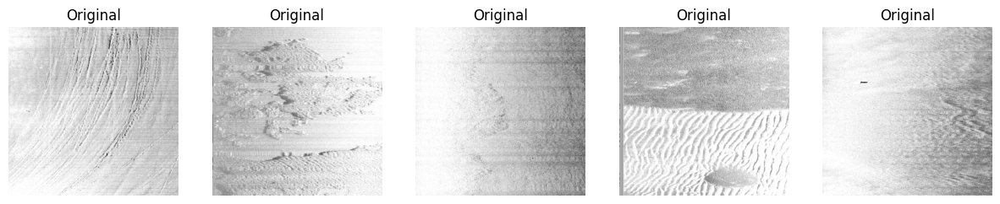

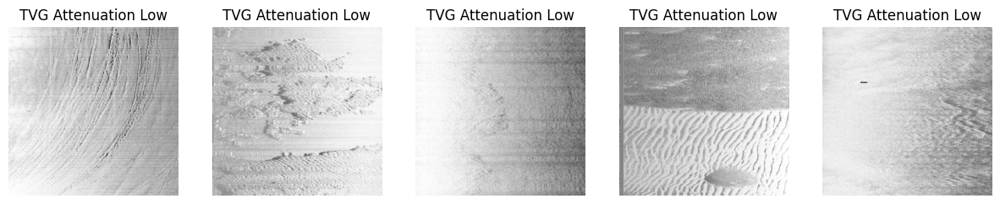

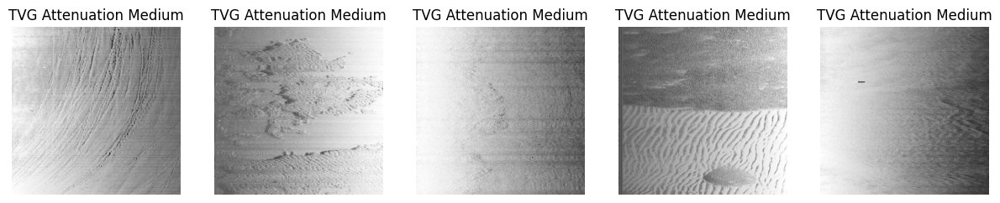

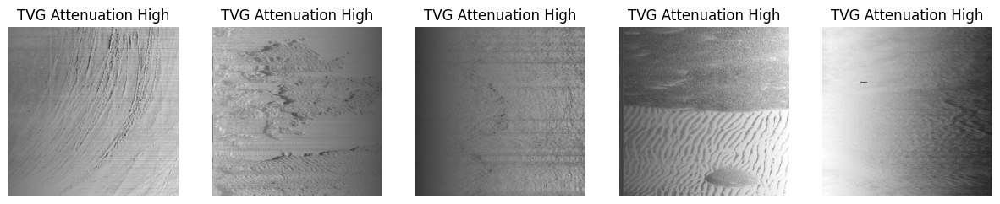

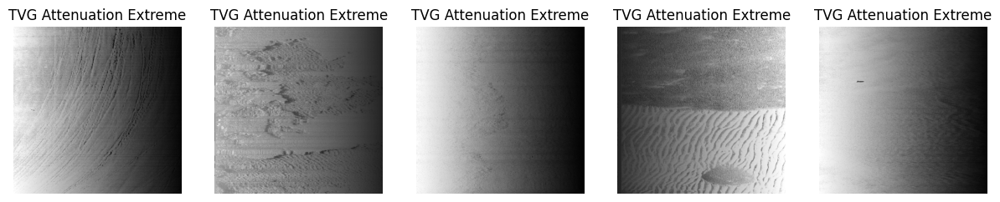

In [27]:
for aug in [
    (lambda x: x, "Original"),
    (TVGAttenuation(retention=(0.00, 0.25), p=1.0), "TVG Attenuation Low"),
    (TVGAttenuation(retention=(0.25, 0.50), p=1.0), "TVG Attenuation Medium"),
    (TVGAttenuation(retention=(0.50, 0.75), p=1.0), "TVG Attenuation High"),
    (TVGAttenuation(retention=(0.75, 1.00), p=1.0), "TVG Attenuation Extreme")
]:
    show_images([
        (aug[0](tile), aug[1])
        for tile in TILES
    ])

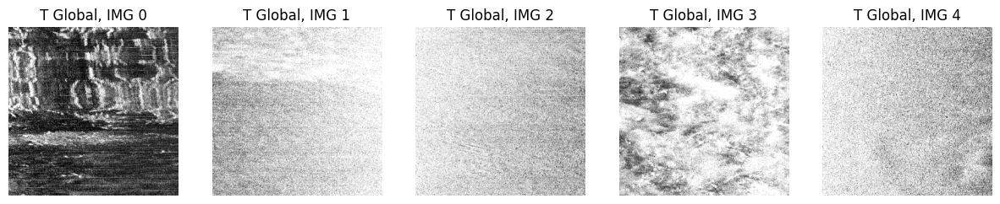

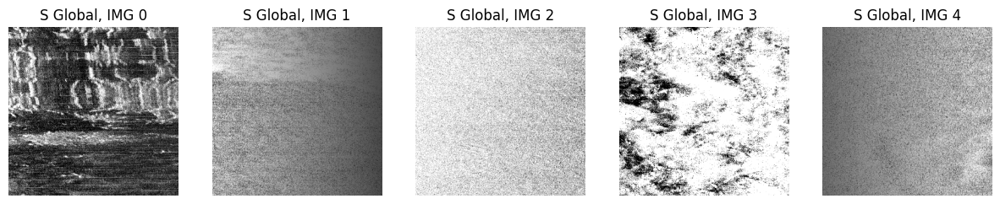

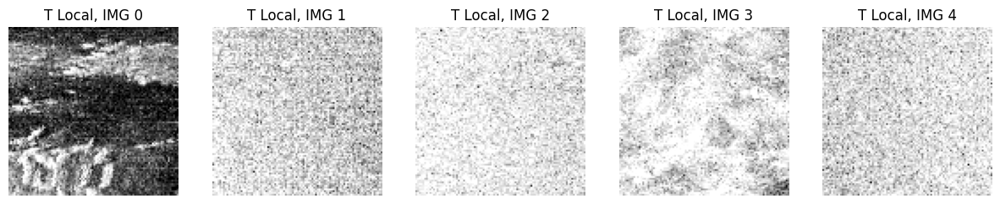

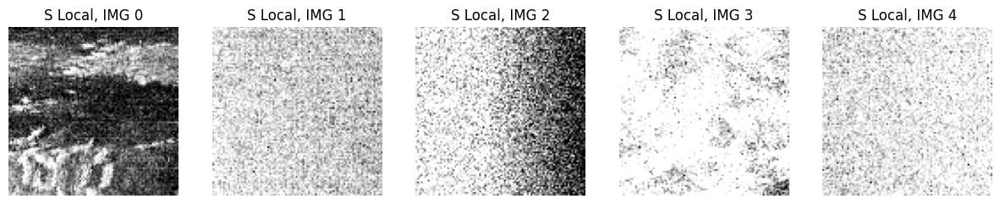

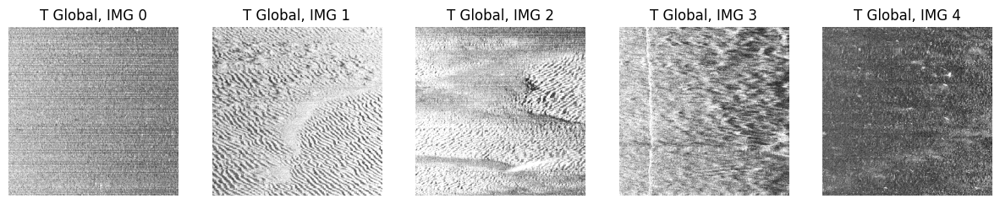

...

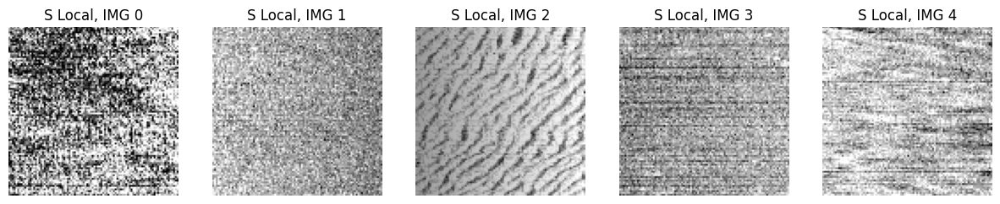

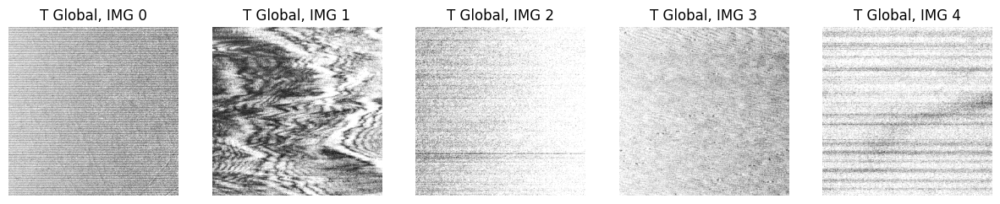

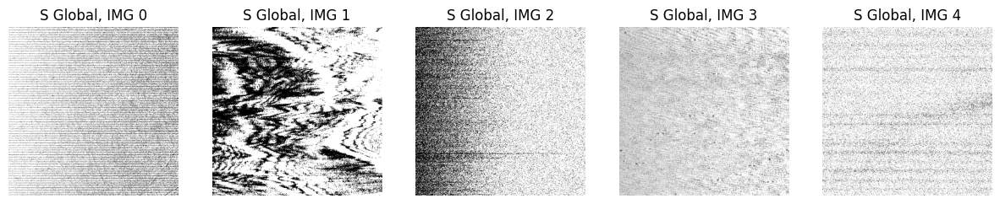

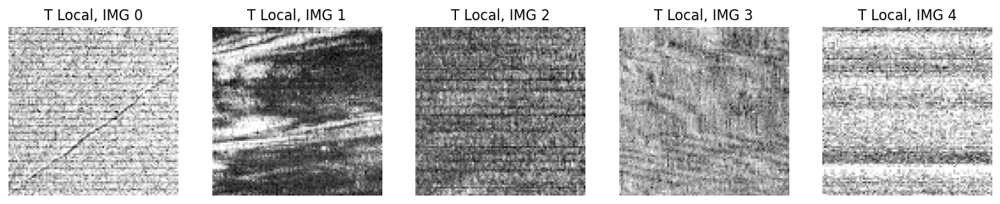

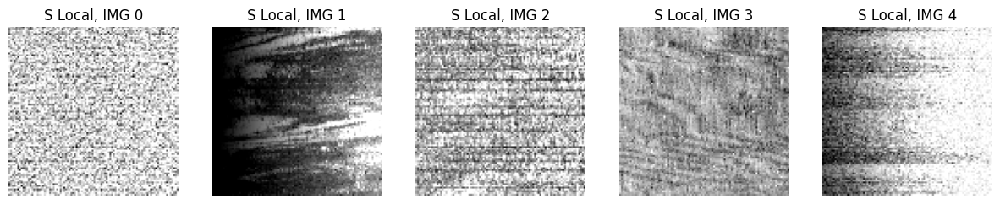

In [28]:
transform = SonarDataTransform()

for _ in range(5):
    augs = [transform(DATASET[i]) for i in get_random_indices()]

    show_images([
        (aug["teacher"]["global_crops"][0], f"T Global, IMG {i}")
        for i, aug in enumerate(augs)
    ], normalize=False)

    show_images([
        (aug["student"]["global_crops"][0], f"S Global, IMG {i}")
        for i, aug in enumerate(augs)
    ], normalize=False)

    show_images([
        (aug["teacher"]["local_crops"][0], f"T Local, IMG {i}")
        for i, aug in enumerate(augs)
    ], normalize=False)

    show_images([
        (aug["student"]["local_crops"][0], f"S Local, IMG {i}")
        for i, aug in enumerate(augs)
    ], normalize=False)